<a href="https://colab.research.google.com/github/ArthAgrawal/Anime_Generation/blob/main/Anime_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
!pip install kaggle


In [6]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"arthagrawal21","key":"d3d198c648bcbbebb22b603d14728845"}'}

In [7]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [8]:
!kaggle datasets download -d lunarwhite/anime-face-dataset-ntumlds -p /content --unzip


Dataset URL: https://www.kaggle.com/datasets/lunarwhite/anime-face-dataset-ntumlds
License(s): unknown
 98% 113M/115M [00:06<00:00, 24.7MB/s]
100% 115M/115M [00:06<00:00, 19.4MB/s]


In [9]:
import kaggle
def download_data():
    kaggle.api.authenticate()
    kaggle.api.dataset_download_files('lunarwhite/anime-face-dataset-ntumlds', path='./', unzip=True)
download_data()

Dataset URL: https://www.kaggle.com/datasets/lunarwhite/anime-face-dataset-ntumlds


36740


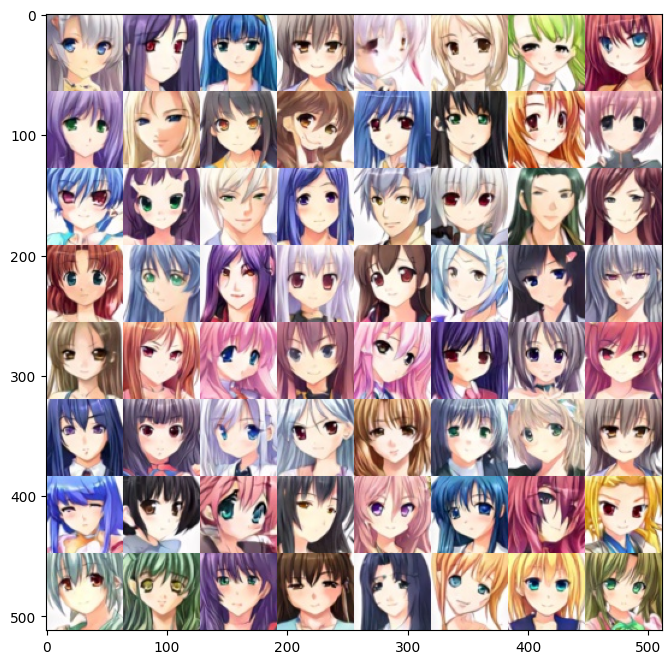

In [10]:
from PIL import Image
import random
import glob
import numpy as np
import matplotlib.pyplot as plt
image_list = []
rows = []
for filename in glob.glob('./images/*.jpg'):
    im=Image.open(filename)
    rows.append([filename])
    image_list.append(filename)
print(len(image_list))
def gallery(array, ncols=8):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result
def make_array():
    arr = []
    for i in range(64):
        random_image = random.choice(image_list)
        arr.append(np.asarray(Image.open(random_image).convert('RGB')))
    return np.array(arr)

array = make_array()
result = gallery(array)
plt.figure(figsize=(8,8))
plt.imshow(result)
plt.show()

In [11]:
import pandas as pd
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image

df = pd.DataFrame(rows)
df.to_csv('data.csv', index=False, header=None)

batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
transform = transforms.Compose([
    transforms.CenterCrop(64),
    transforms.Resize(64, interpolation=2),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

class AnimeData(Dataset):
    """
    Wrap the data into a Dataset class, and then pass it to the DataLoader
    :__init__: Initialization data
    :__getitem__: support the indexing such that dataset[i] can be used to get ith sample
    :__len__: return the size of the dataset.
    """
    def __init__(self, root, transform=None):
        self.frame = pd.read_csv(root, header=None)
        self.transform = transform

    def __len__(self):
        return len(self.frame)

    def __getitem__(self, index):
        image_name = self.frame.iloc[index, 0]
        image = Image.open(image_name)
        if self.transform:
            image = self.transform(image)
        return image

trainset = AnimeData(root='./data.csv', transform=transform)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=0)


100%|██████████| 288/288 [00:31<00:00,  9.25it/s]


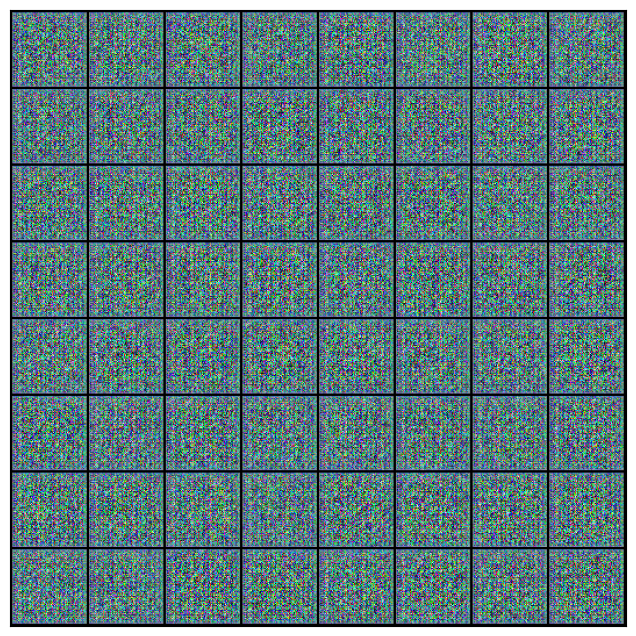

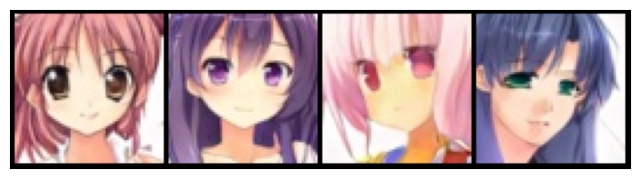

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from tqdm import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

latent_size = 128
class Generator(nn.Module):
    def __init__(self, latent_size):
        super(Generator, self).__init__()
        """
        Initialize the Generator Module
        :param latent_size: The length of the input latent vector
        """
        self.conv_block1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=latent_size, out_channels=512, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network
        :return: A 3x64x64 Tensor image as output
        """
        x = self.conv_block1(x)
        return x

G = Generator(latent_size).to(device)


batch_size = 128
noise = torch.randn(batch_size, latent_size, 1, 1).to(device)


fake_images = G(noise)


def denorm(img_tensors):
    return img_tensors * 0.5 + 0.5

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))


show_images(fake_images.cpu())

for real_images in tqdm(trainloader):
    real_images = real_images.to(device)

show_images(real_images.cpu())



In [14]:
class Discriminator(nn.Module):
    def __init__(self,inchannels):
        super(Discriminator,self).__init__()
        """
        Initialize the Discriminator Module
        :param inchannels: The depth of the first convolutional layer
        """
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=0),
            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self,x):

        x = self.conv_block1(x)
        return x

D=Discriminator(3).to(device)

In [15]:
import torch.optim as optim
lr=0.0002
opt_d = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))

In [16]:
loss_fn = torch.nn.MSELoss()
def Real_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds-label_noise)
    return loss

def Fake_loss(preds,targets):
    '''
       Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss
    '''
    beta_distr = torch.distributions.beta.Beta(1,5,validate_args=None)
    label_noise = beta_distr.sample(sample_shape=targets.shape).to(torch.device(device))
    loss= loss_fn(targets,preds+label_noise)
    return loss

100%|██████████| 288/288 [01:37<00:00,  2.95it/s]


Epoch [1/15], loss_g: 0.6350, loss_d: 0.0857, real_score: 0.7770, fake_score: 0.2876
Saving generated-images-0001.png


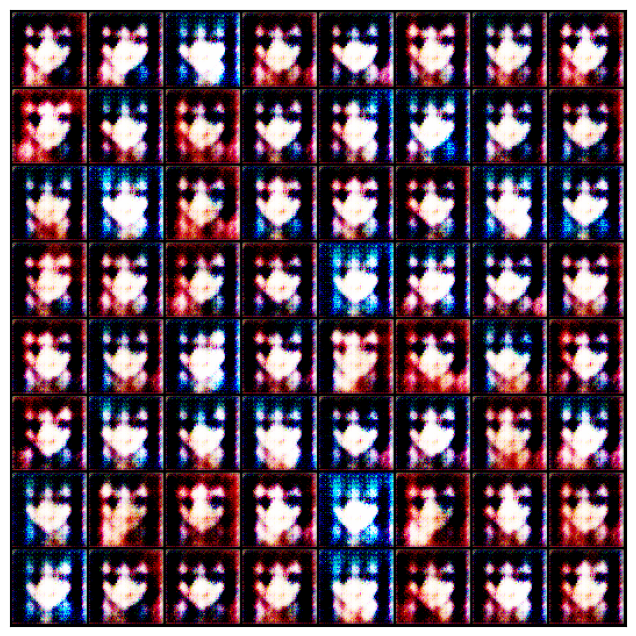

100%|██████████| 288/288 [01:32<00:00,  3.10it/s]


Epoch [2/15], loss_g: 0.6960, loss_d: 0.2558, real_score: 0.8615, fake_score: 0.6226
Saving generated-images-0002.png


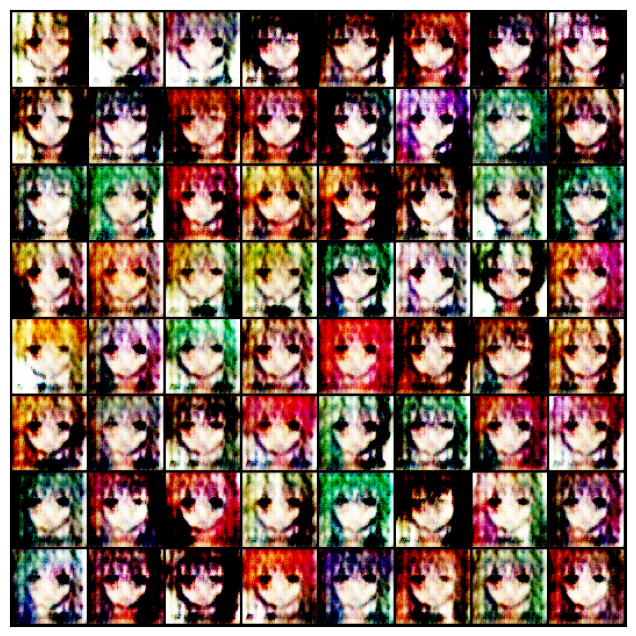

100%|██████████| 288/288 [01:33<00:00,  3.09it/s]


Epoch [3/15], loss_g: 0.6849, loss_d: 0.0726, real_score: 0.7751, fake_score: 0.0623
Saving generated-images-0003.png


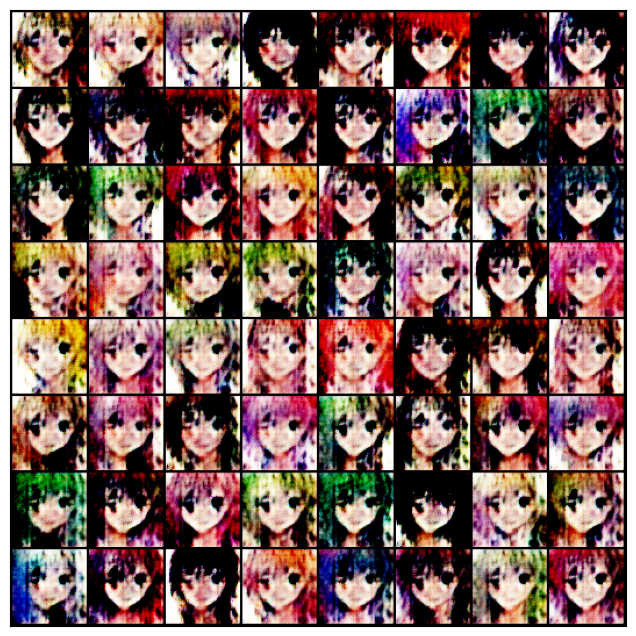

100%|██████████| 288/288 [01:35<00:00,  3.03it/s]


Epoch [4/15], loss_g: 0.6688, loss_d: 0.1072, real_score: 0.9528, fake_score: 0.0307
Saving generated-images-0004.png


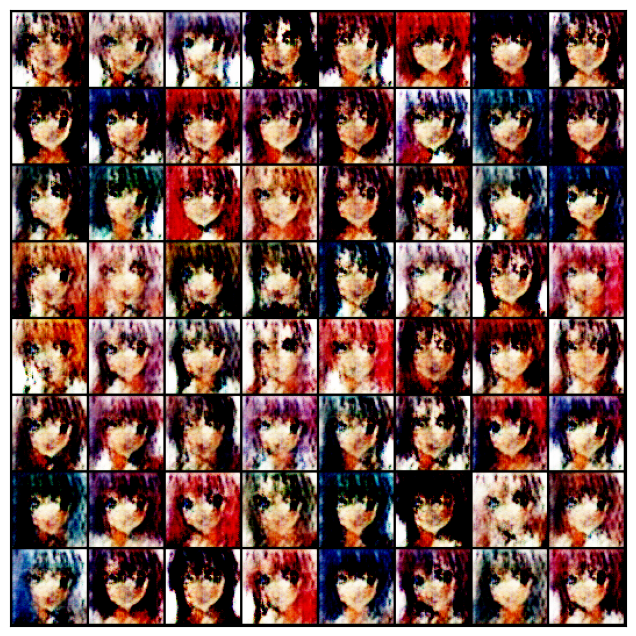

100%|██████████| 288/288 [01:36<00:00,  2.99it/s]


Epoch [5/15], loss_g: 0.6334, loss_d: 0.1275, real_score: 0.6556, fake_score: 0.0260
Saving generated-images-0005.png


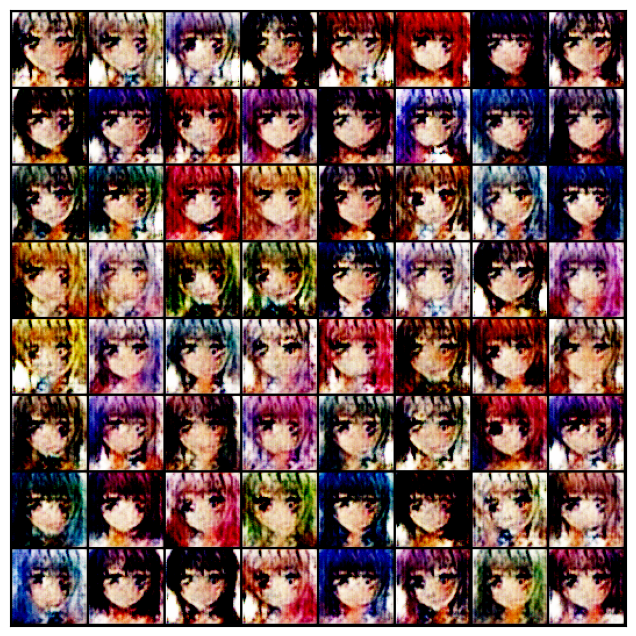

100%|██████████| 288/288 [01:36<00:00,  3.00it/s]


Epoch [6/15], loss_g: 0.5123, loss_d: 0.1734, real_score: 0.5205, fake_score: 0.0647
Saving generated-images-0006.png


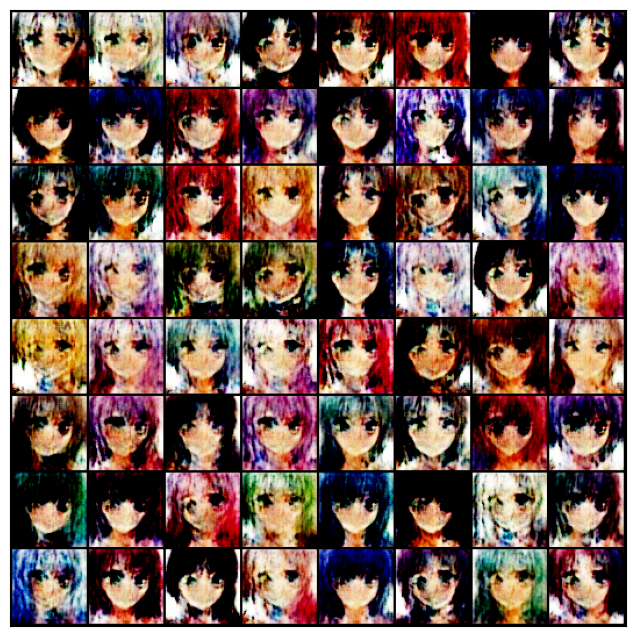

100%|██████████| 288/288 [01:37<00:00,  2.95it/s]


Epoch [7/15], loss_g: 0.5022, loss_d: 0.0310, real_score: 0.8431, fake_score: 0.1196
Saving generated-images-0007.png


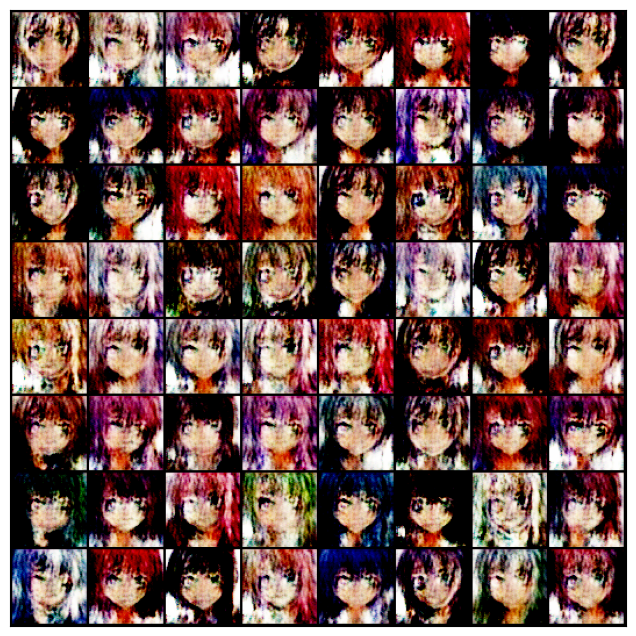

100%|██████████| 288/288 [01:37<00:00,  2.96it/s]


Epoch [8/15], loss_g: 0.5719, loss_d: 0.1345, real_score: 0.7796, fake_score: 0.4091
Saving generated-images-0008.png


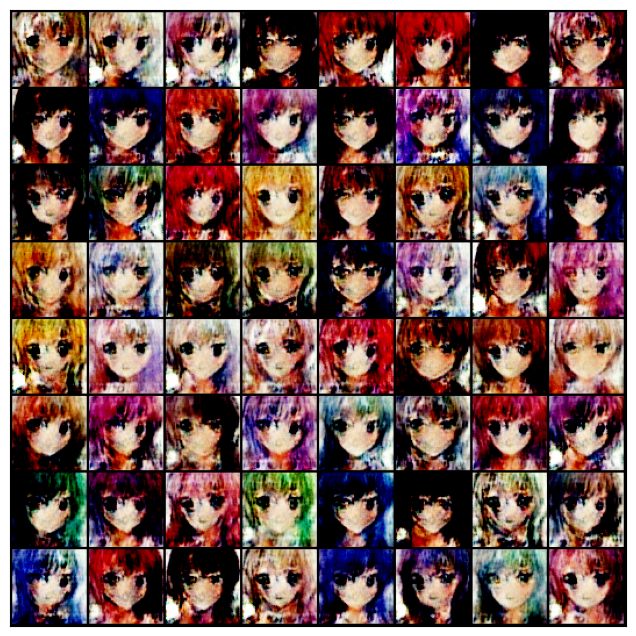

100%|██████████| 288/288 [01:37<00:00,  2.96it/s]


Epoch [9/15], loss_g: 0.4663, loss_d: 0.0440, real_score: 0.7927, fake_score: 0.1006
Saving generated-images-0009.png


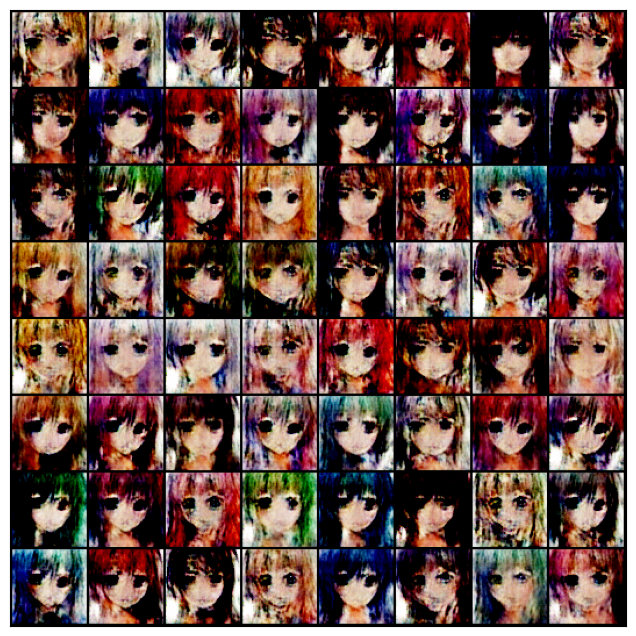

100%|██████████| 288/288 [01:38<00:00,  2.92it/s]


Epoch [10/15], loss_g: 0.5320, loss_d: 0.0286, real_score: 0.8747, fake_score: 0.0904
Saving generated-images-0010.png


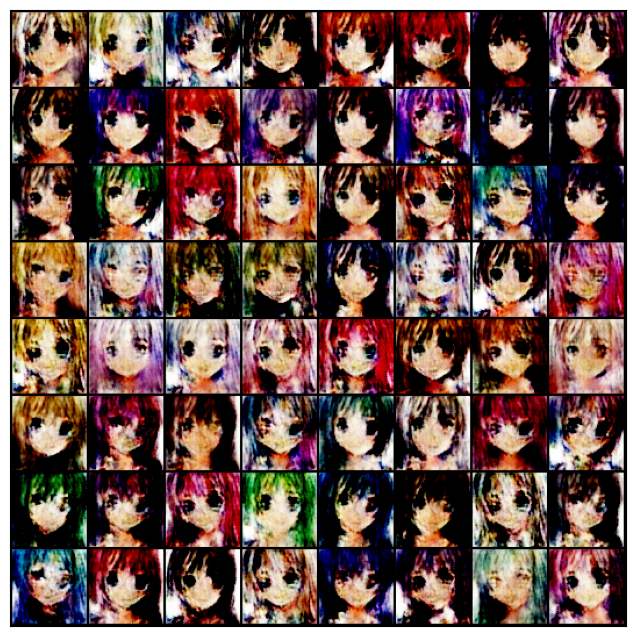

100%|██████████| 288/288 [01:37<00:00,  2.94it/s]


Epoch [11/15], loss_g: 0.5706, loss_d: 0.0546, real_score: 0.8289, fake_score: 0.0530
Saving generated-images-0011.png


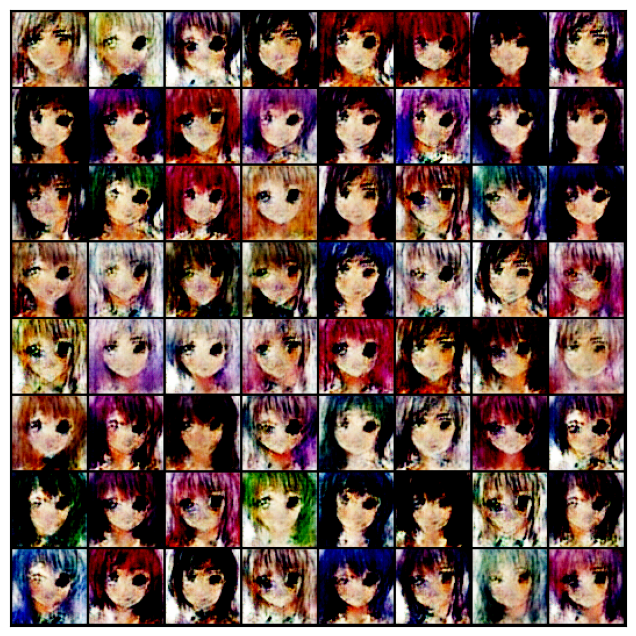

100%|██████████| 288/288 [01:36<00:00,  2.97it/s]


Epoch [12/15], loss_g: 0.3596, loss_d: 0.0418, real_score: 0.7121, fake_score: 0.2168
Saving generated-images-0012.png


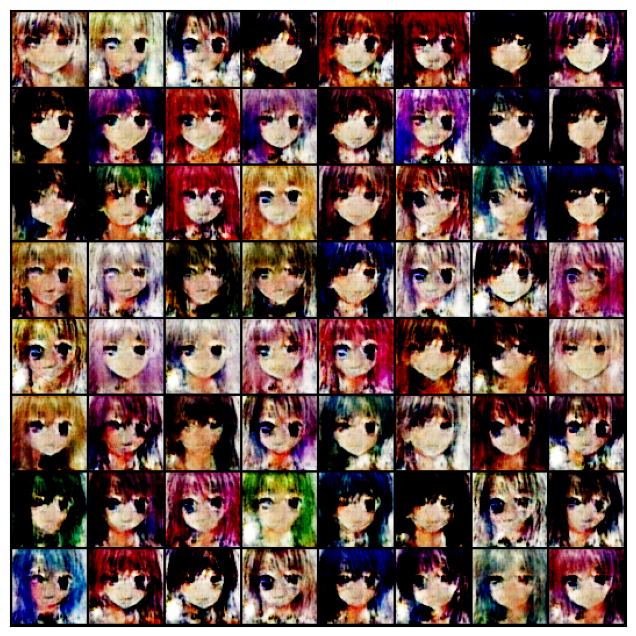

100%|██████████| 288/288 [01:38<00:00,  2.93it/s]


Epoch [13/15], loss_g: 0.5871, loss_d: 0.0519, real_score: 0.8466, fake_score: 0.1038
Saving generated-images-0013.png


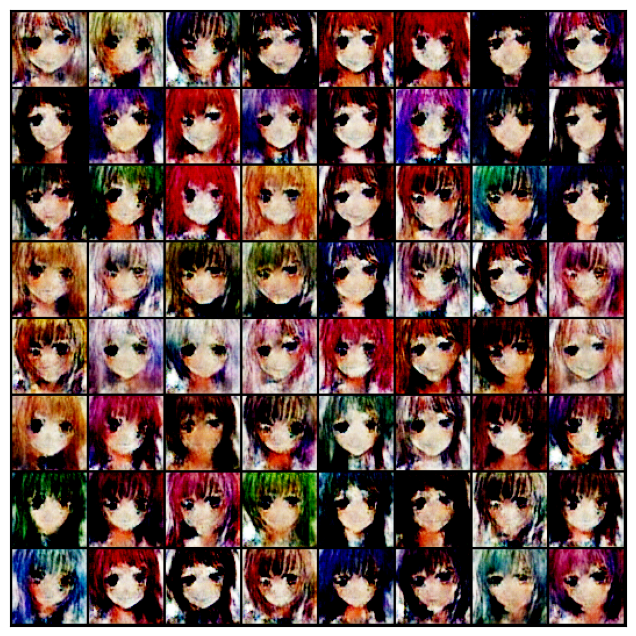

100%|██████████| 288/288 [01:38<00:00,  2.93it/s]


Epoch [14/15], loss_g: 0.5097, loss_d: 0.0421, real_score: 0.8912, fake_score: 0.2299
Saving generated-images-0014.png


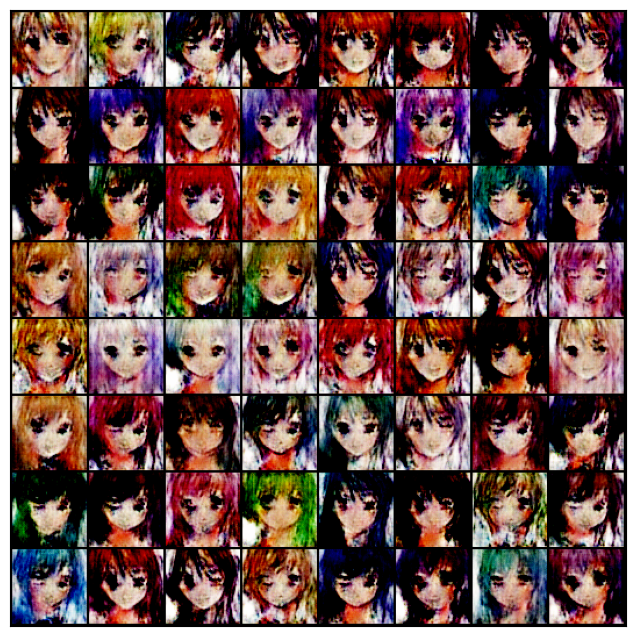

100%|██████████| 288/288 [01:38<00:00,  2.93it/s]


Epoch [15/15], loss_g: 0.5806, loss_d: 0.0594, real_score: 0.7627, fake_score: 0.0818
Saving generated-images-0015.png


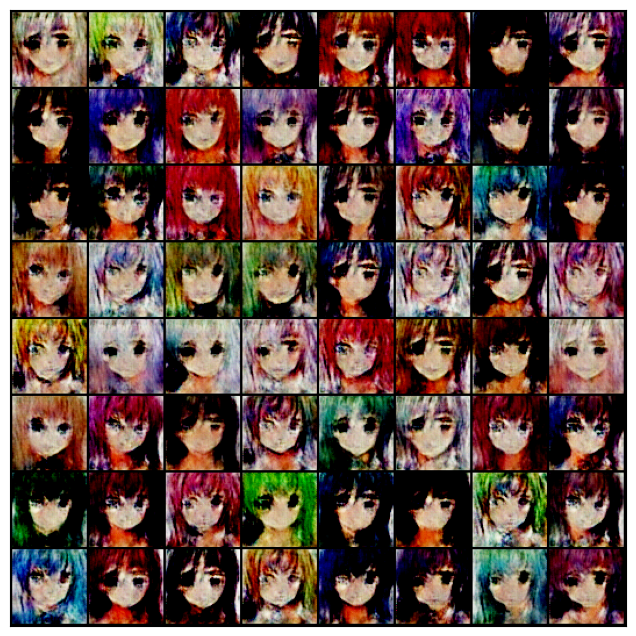

In [18]:
import os
from torchvision.utils import save_image

sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)
def save_samples(index, latent_tensors, generator, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
        plt.show()
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

losses_g = []
losses_d = []
real_scores = []
fake_scores = []
def train(D, G, d_optimizer, g_optimizer, epochs=1):
    iter_count = 0
    start_idx=1
    for epoch in range(epochs):
        for real_images in tqdm(trainloader):
            real_images=real_images.to(device)

            # Pass real images through discriminator
            D_out_real = D(real_images)
            label_real = torch.full(D_out_real.shape, 1.0).to(torch.device(device))
            real_loss = Real_loss(label_real,D_out_real)
            real_score = torch.mean(D_out_real).item()

            # Generate fake images
            noise = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images =  G(noise)

            # Pass fake images through discriminator
            D_out_fake = D(fake_images)
            label_fake =  torch.full(D_out_fake.shape, 0).to(torch.device(device))
            fake_loss = Fake_loss(label_fake, D_out_fake)
            fake_score = torch.mean(D_out_fake).item()

            # Update discriminator weights
            loss_d = real_loss + fake_loss

            d_optimizer.zero_grad()
            loss_d.backward(retain_graph = True)
            d_optimizer.step()

            # Generate fake images
            noise2 = torch.randn(batch_size, latent_size, 1, 1).to(torch.device(device))
            fake_images2 =  G(noise2)

            gen_steps = 1
            for i in range(0, gen_steps ):
            # Try to fool the discriminator
                D_out_fake2 = D(fake_images2)

                # The label is set to 1(real-like) to fool the discriminator
                label_real1 = torch.full(D_out_fake2.shape, 1.0).to(torch.device(device))
                loss_g = Real_loss(label_real1, D_out_fake2)

                # Update generator weights
                g_optimizer.zero_grad()
                loss_g.backward(retain_graph = (i<gen_steps -1 ))
                g_optimizer.step()


        losses_g.append(loss_g.item())
        losses_d.append(loss_d.item())
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
        epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent,G, show=True)

        state_dis = {'dis_model': D.state_dict(), 'epoch': epoch}
        state_gen = {'gen_model': G.state_dict(), 'epoch': epoch}
        if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
        torch.save(state_dis, 'checkpoint/'+'D__'+str(epoch+1)) #each epoch
        torch.save(state_gen, 'checkpoint/'+'G__'+str(epoch+1)) #each epoch
#Train the GAN
train(D,G,opt_d,opt_g,epochs=15)

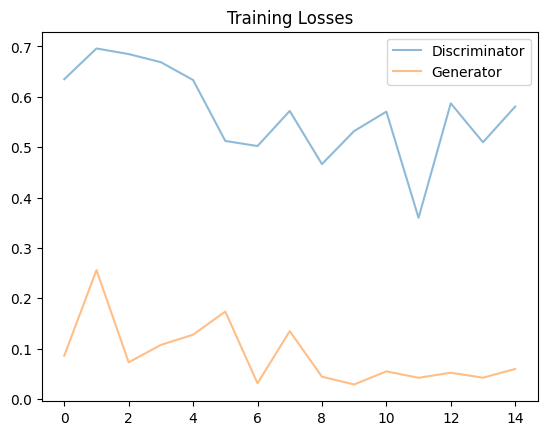

In [19]:
fig, ax = plt.subplots()
plt.plot(losses_g, label='Discriminator', alpha=0.5)
plt.plot(losses_d, label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()